In [1]:
# Install or import necessary packages
import os
import json
import tempfile
from pathlib import Path
import subprocess
import shlex
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt

# Make sure FFmpeg is installed: https://ffmpeg.org/download.html
# Install open_clip if not available:
# !pip install git+https://github.com/mlfoundations/open_clip.git

# 2. Extract Frames (2 fps) with FFmpeg


In [8]:

# Path to input video (handle special characters automatically)
video_path = '/Users/constantinseibold/Downloads/(02) Mountains.ia.mp4'
# Create a temporary directory for frames
temp_dir = './tmp_data'

# Build FFmpeg command to extract 2 fps as JPEG images
# Use -y to overwrite, -loglevel error to suppress info
extract_cmd = [
    'ffmpeg',
    '-y',
    '-i', video_path,
    '-vf', 'fps=2',       # 2 frames per second
    '-q:v', '2',          # quality setting for JPEG (lower is better)
    f"{temp_dir}/frame_%05d.jpg"
]

try:
    print('Running FFmpeg to extract frames...')
    result = subprocess.run(extract_cmd, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    print('FFmpeg extraction completed.')
except subprocess.CalledProcessError as e:
    print('FFmpeg failed with error:')
    print(e.stderr.decode('utf-8'))
    print('Falling back to OpenCV extraction method...')
    import cv2
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 1
    interval = int(fps / 2) if fps >= 2 else 1
    count, extracted = 0, 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        if count % interval == 0:
            frame_path = Path(temp_dir) / f"frame_{extracted:05d}.jpg"
            cv2.imwrite(str(frame_path), frame)
            extracted += 1
        count += 1
    cap.release()
    print(f"Extracted {extracted} frames via OpenCV to {temp_dir}")

# Count extracted frames
frame_files = sorted(Path(temp_dir).glob('frame_*.jpg'))
print(f"Total extracted frames: {len(frame_files)} (location: {temp_dir})")

Running FFmpeg to extract frames...
FFmpeg extraction completed.
Total extracted frames: 6908 (location: ./tmp_data)


# 3. Compute Multimodal Embeddings


In [2]:
temp_dir = './tmp_data'

from utils.data import ImageFolderDataset, get_transforms
from utils.feature_extraction import extract_features

# Create dataset and dataloader
transform = get_transforms()

dataset = ImageFolderDataset(root=temp_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

# Extract features using SigLIP2
device = 'mps' if torch.cuda.is_available() else 'cpu'
features, _ = extract_features(tag='siglip2', dataloader=dataloader, device=device)
print(f"Features shape: {features.shape}")

# Save embeddings and metadata to JSON
embeddings = {
    'paths': dataset.get_image_paths(),
    'features': features.tolist()
}
json_path = Path(temp_dir) / 'embeddings.json'
with open(json_path, 'w') as f:
    json.dump(embeddings, f)
print(f"Saved embeddings JSON to {json_path}")

Loading Model: siglip2


/Users/constantinseibold/workspace/CVPR_Tutorial/Identifying_Structure_In_Data/clustering/image_clustering/utils/feature_extraction.py:47: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
/opt/anaconda3/envs/tutorial/lib/python3.11/site-packages/torch/amp/autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(


Loaded Model: siglip2
Beginning Feature Extraction


100%|██████████| 216/216 [04:16<00:00,  1.19s/it]


feature shape (6908, 768)
labels shape (6908,)
Features shape: (6908, 768)
Saved embeddings JSON to tmp_data/embeddings.json


Visualize Embeddings


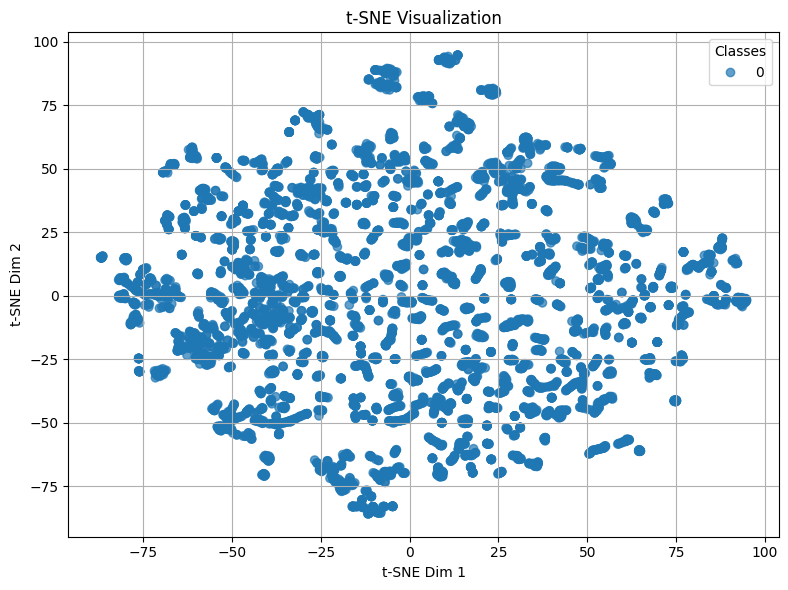

In [52]:

from utils.visualize import apply_tsne, plot_tsne, plot_multiple_tsne, plot_cluster_images

# Apply t-SNE on the features
reduced = apply_tsne(features, n_components=2, perplexity=30)
plot_tsne(reduced, labels=[0]*len(reduced))


[2150, 687, 219, 69, 24, 5]


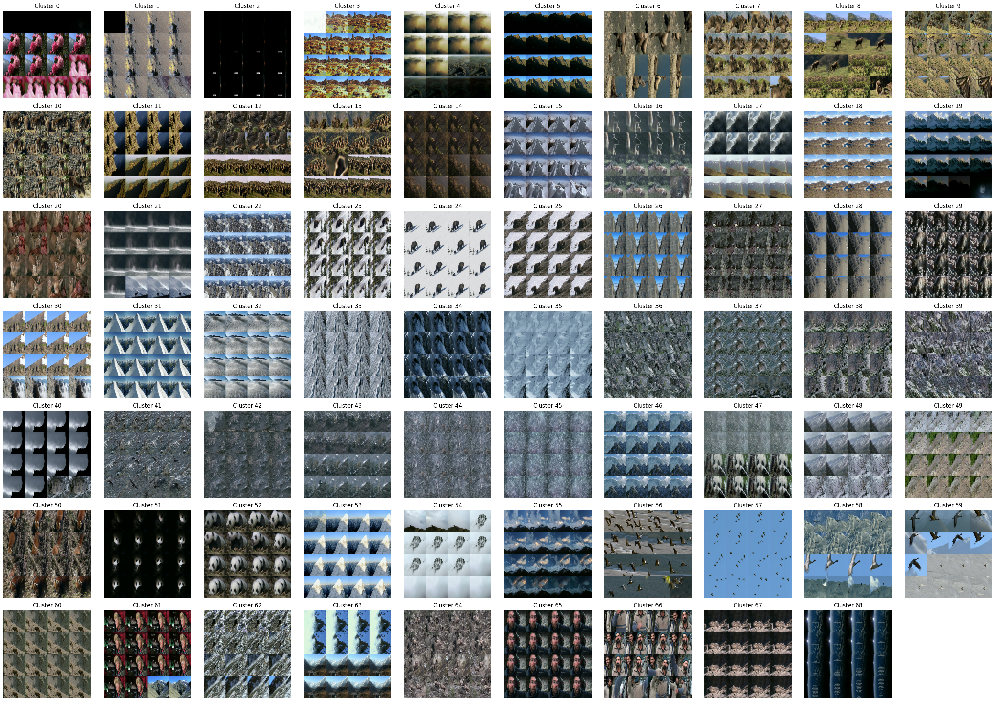

In [53]:
from utils.twfinch import FINCH

c, num_clust, req_c = FINCH(features, tw_finch=True)
print(num_clust)
 
image_paths_ = sorted(glob.glob('./tmp_data/*.jpg'))
image_paths = np.array([[i] for i in image_paths_])
#  plot_multiple_tsne([features]*len(num_clust), [c[:,i] for i in range(len(num_clust))])
plot_cluster_images(dataset_samples=image_paths, cluster_labels=c[:,-3], clusters_per_row=10, images_per_cluster=16)
# image_paths

Clusters matching 'A snowy mountain peak at sunrise': [(31, 0.07954150438308716), (15, 0.07662127166986465), (22, 0.063693106174469), (32, 0.06191365793347359), (46, 0.06139019876718521)]


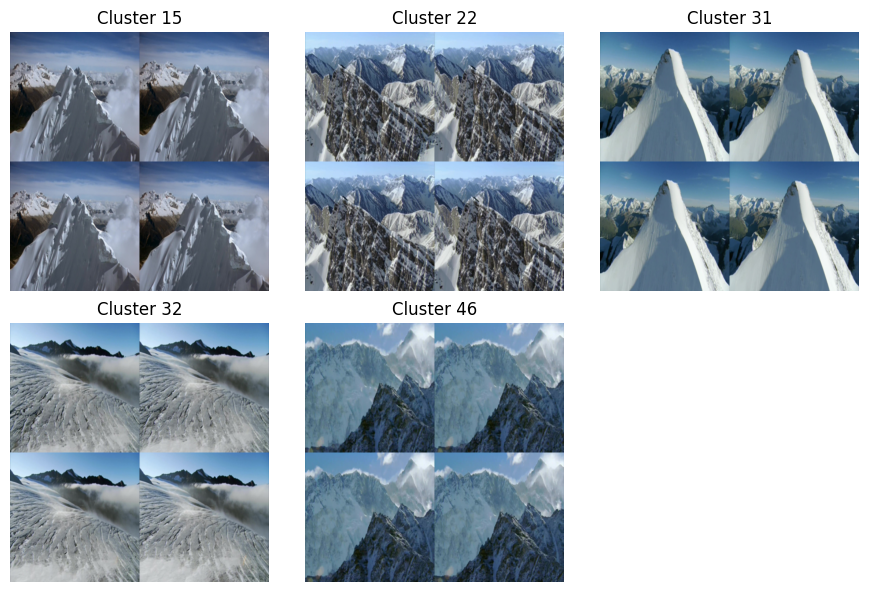

In [51]:

import numpy as np
import torch
from open_clip import create_model_from_pretrained, get_tokenizer
from utils.feature_extraction import model_dict

# Load CLIP model for text embedding (use same as feature extractor)
model_name = model_dict['siglip2']  # assumes model_dict available
clip_model, _ = create_model_from_pretrained(model_name)
clip_model = clip_model.to(device).eval()
tokenizer = get_tokenizer(model_name)

# Pre-compute cluster centroids (mean feature per segment)
# Assume `labels` is the segmentation vector for each frame (length matches features)
labels_seg = c[:,-3]
unique_labels = np.unique(labels_seg)
centroids = {}
for lab in unique_labels:
    centroids[lab] = features[labels_seg == lab].mean(axis=0)
centroid_matrix = np.stack([centroids[lab] for lab in unique_labels])  # shape (num_clusters, feat_dim)

# Normalize centroids
centroid_tensor = torch.from_numpy(centroid_matrix)
centroid_norm = centroid_tensor / centroid_tensor.norm(dim=1, keepdim=True)

# Retrieval function
def retrieve_clusters(
    query: str,
    threshold: float = 0.0,
    top_k: int = 5,
) -> list:
    """
    Given a text query, return segment labels whose centroids have
    cosine similarity >= threshold with the query embedding.
    """
    with torch.no_grad():
        # Tokenize and encode query
        tokens = tokenizer([query], context_length=clip_model.context_length)
        text_embed = clip_model.encode_text(tokens.to(device)).cpu()
        text_norm = text_embed / text_embed.norm(dim=1, keepdim=True)  # shape (1, D)

        # Compute cosine similarities
        
        sims = (text_norm @ centroid_norm.T).squeeze(0).cpu().numpy()  # shape (num_clusters,)

    # Filter
    hits = [(int(lab), float(sim)) for lab, sim in zip(unique_labels, sims) if sim >= threshold]
    # sort by descending similarity
    hits = sorted(hits, key=lambda x: x[1], reverse=True)[:top_k]
    return hits

# Example usage
query = "A snowy mountain peak at sunrise"
hits = retrieve_clusters(query, threshold=0.0)
print(f"Clusters matching '{query}':", hits)

hits = [x[0] for x in hits]
samples = image_paths[np.isin(labels_seg, hits)]
masks = labels_seg[np.isin(labels_seg, hits)]

plot_cluster_images(samples, masks, cluster_names=None, clusters_per_row=3, images_per_cluster=4)

In [ ]:
import numpy as np
import torch
import torchvision.transforms as T
from decord import VideoReader, cpu
from PIL import Image
from torchvision.transforms.functional import InterpolationMode
from transformers import AutoModel, AutoTokenizer


# model setting
model_path = 'OpenGVLab/InternVL_2_5_HiCo_R16'

tokenizer = AutoTokenizer.from_pretrained(model_path, trust_remote_code=True)
model = AutoModel.from_pretrained(model_path, trust_remote_code=True).half().cuda()

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

def build_transform(input_size):
    MEAN, STD = IMAGENET_MEAN, IMAGENET_STD
    transform = T.Compose([T.Lambda(lambda img: img.convert("RGB") if img.mode != "RGB" else img), T.Resize((input_size, input_size), interpolation=InterpolationMode.BICUBIC), T.ToTensor(), T.Normalize(mean=MEAN, std=STD)])
    return transform


def find_closest_aspect_ratio(aspect_ratio, target_ratios, width, height, image_size):
    best_ratio_diff = float("inf")
    best_ratio = (1, 1)
    area = width * height
    for ratio in target_ratios:
        target_aspect_ratio = ratio[0] / ratio[1]
        ratio_diff = abs(aspect_ratio - target_aspect_ratio)
        if ratio_diff < best_ratio_diff:
            best_ratio_diff = ratio_diff
            best_ratio = ratio
        elif ratio_diff == best_ratio_diff:
            if area > 0.5 * image_size * image_size * ratio[0] * ratio[1]:
                best_ratio = ratio
    return best_ratio


def dynamic_preprocess(image, min_num=1, max_num=6, image_size=448, use_thumbnail=False):
    orig_width, orig_height = image.size
    aspect_ratio = orig_width / orig_height

    # calculate the existing image aspect ratio
    target_ratios = set((i, j) for n in range(min_num, max_num + 1) for i in range(1, n + 1) for j in range(1, n + 1) if i * j <= max_num and i * j >= min_num)
    target_ratios = sorted(target_ratios, key=lambda x: x[0] * x[1])

    # find the closest aspect ratio to the target
    target_aspect_ratio = find_closest_aspect_ratio(aspect_ratio, target_ratios, orig_width, orig_height, image_size)

    # calculate the target width and height
    target_width = image_size * target_aspect_ratio[0]
    target_height = image_size * target_aspect_ratio[1]
    blocks = target_aspect_ratio[0] * target_aspect_ratio[1]

    # resize the image
    resized_img = image.resize((target_width, target_height))
    processed_images = []
    for i in range(blocks):
        box = ((i % (target_width // image_size)) * image_size, (i // (target_width // image_size)) * image_size, ((i % (target_width // image_size)) + 1) * image_size, ((i // (target_width // image_size)) + 1) * image_size)
        # split the image
        split_img = resized_img.crop(box)
        processed_images.append(split_img)
    assert len(processed_images) == blocks
    if use_thumbnail and len(processed_images) != 1:
        thumbnail_img = image.resize((image_size, image_size))
        processed_images.append(thumbnail_img)
    return processed_images


def load_image(image, input_size=448, max_num=6):
    transform = build_transform(input_size=input_size)
    images = dynamic_preprocess(image, image_size=input_size, use_thumbnail=True, max_num=max_num)
    pixel_values = [transform(image) for image in images]
    pixel_values = torch.stack(pixel_values)
    return pixel_values


def get_index(bound, fps, max_frame, first_idx=0, num_segments=32):
    if bound:
        start, end = bound[0], bound[1]
    else:
        start, end = -100000, 100000
    start_idx = max(first_idx, round(start * fps))
    end_idx = min(round(end * fps), max_frame)
    seg_size = float(end_idx - start_idx) / num_segments
    frame_indices = np.array([int(start_idx + (seg_size / 2) + np.round(seg_size * idx)) for idx in range(num_segments)])
    return frame_indices

def get_num_frames_by_duration(duration):
        local_num_frames = 4        
        num_segments = int(duration // local_num_frames)
        if num_segments == 0:
            num_frames = local_num_frames
        else:
            num_frames = local_num_frames * num_segments
        
        num_frames = min(512, num_frames)
        num_frames = max(128, num_frames)

        return num_frames

def load_video(video_path, bound=None, input_size=448, max_num=1, num_segments=32, get_frame_by_duration = False):
    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    max_frame = len(vr) - 1
    fps = float(vr.get_avg_fps())

    pixel_values_list, num_patches_list = [], []
    transform = build_transform(input_size=input_size)
    if get_frame_by_duration:
        duration = max_frame / fps
        num_segments = get_num_frames_by_duration(duration)
    frame_indices = get_index(bound, fps, max_frame, first_idx=0, num_segments=num_segments)
    for frame_index in frame_indices:
        img = Image.fromarray(vr[frame_index].asnumpy()).convert("RGB")
        img = dynamic_preprocess(img, image_size=input_size, use_thumbnail=True, max_num=max_num)
        pixel_values = [transform(tile) for tile in img]
        pixel_values = torch.stack(pixel_values)
        num_patches_list.append(pixel_values.shape[0])
        pixel_values_list.append(pixel_values)
    pixel_values = torch.cat(pixel_values_list)
    return pixel_values, num_patches_list

# evaluation setting
max_num_frames = 512
generation_config = dict(
    do_sample=False,
    temperature=0.0,
    max_new_tokens=1024,
    top_p=0.1,
    num_beams=1
)
video_path = "your_video.mp4"
num_segments=128


with torch.no_grad():
  
  pixel_values, num_patches_list = load_video(video_path, num_segments=num_segments, max_num=1, get_frame_by_duration=False)
  pixel_values = pixel_values.to(torch.bfloat16).to(model.device)
  video_prefix = "".join([f"Frame{i+1}: <image>\n" for i in range(len(num_patches_list))])
  # single-turn conversation
  question1 = "Describe this video in detail."
  question = video_prefix + question1
  output1, chat_history = model.chat(tokenizer, pixel_values, question, generation_config, num_patches_list=num_patches_list, history=None, return_history=True)
  print(output1)
  
  # multi-turn conversation
  question2 = "How many people appear in the video?"
  output2, chat_history = model.chat(tokenizer, pixel_values, question, generation_config, num_patches_list=num_patches_list, history=chat_history, return_history=True)
  
  print(output2)
